In [1]:
# Import the dependencies
import pandas as pd
import numpy as np
import datetime
import os 
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# ORM Stuff
from sqlalchemy import create_engine, inspect, text, func
# from sqlalchemy.orm import Session
# from sqlalchemy.ext.automap import automap_base

In [2]:
import os
print(os.getcwd())

C:\Users\dubja\OneDrive\Documents\Bootcamp Oct2024\Github_HW\MSUDA-project4-group11\MSUDA-project4-group11\submission\analysis\data


In [3]:
# Correct path using raw string literal (method 2)
file_path = r"C:\Users\dubja\OneDrive\Documents\Bootcamp Oct2024\Github_HW\MSUDA-project4-group11\MSUDA-project4-group11\submission\analysis\data\game_sales_tableau_clean.csv"

# Load the CSV file
df_game_sales = pd.read_csv(file_path)

# Display the first few rows
df_game_sales.head()

,name,platform,Year,Genre,Publisher,NA,EU,JP,Other,Global,Critic_Score,Critic_Count,User_Score,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,Nintendo,E
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,Nintendo,E
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN


In [4]:
print(os.path.exists(file_path))

True


In [6]:
df_game_sales

,name,platform,Year,Genre,Publisher,NA,EU,JP,Other,Global,Critic_Score,Critic_Count,User_Score,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,Nintendo,E
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,Nintendo,E
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN
5,Tetris,GB,1989,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,NaN,NaN,NaN,NaN,NaN
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,Nintendo,E
7,Wii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,Nintendo,E
8,New Super Mario Bros. Wii,Wii,2009,Platform,Nintendo,14.44,6.94,4.70,2.24,28.32,87.0,80.0,8.4,Nintendo,E
9,Duck Hunt,NES,1984,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31,NaN,NaN,NaN,NaN,NaN


In [7]:
df_game_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16441 entries, 0 to 16440
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          16441 non-null  object 
 1   platform      16441 non-null  object 
 2   Year          16441 non-null  int64  
 3   Genre         16441 non-null  object 
 4   Publisher     16441 non-null  object 
 5   NA            16441 non-null  float64
 6   EU            16441 non-null  float64
 7   JP            16441 non-null  float64
 8   Other         16441 non-null  float64
 9   Global        16441 non-null  float64
 10  Critic_Score  8299 non-null   float64
 11  Critic_Count  8007 non-null   float64
 12  User_Score    10145 non-null  object 
 13  Developer     9929 non-null   object 
 14  Rating        9792 non-null   object 
dtypes: float64(7), int64(1), object(7)
memory usage: 1.9+ MB


In [8]:
print(df_game_sales.columns)

Index(['name', 'platform', 'Year', 'Genre', 'Publisher', 'NA', 'EU', 'JP',
       'Other', 'Global', 'Critic_Score', 'Critic_Count', 'User_Score',
       'Developer', 'Rating'],
      dtype='object')


In [9]:
# Check column names to identify the critic score column
print(df_game_sales.columns)

# Assuming the column for critic scores is named 'critic_score'
print(df_game_sales['Critic_Score'].head())

Index(['name', 'platform', 'Year', 'Genre', 'Publisher', 'NA', 'EU', 'JP',
       'Other', 'Global', 'Critic_Score', 'Critic_Count', 'User_Score',
       'Developer', 'Rating'],
      dtype='object')
0    76.0
1     NaN
2    82.0
3    80.0
4     NaN
Name: Critic_Score, dtype: float64


In [10]:
# Assuming the columns are named 'Sritic_Score', 'User_Score', 'Publisher', 'Genre', 'platform', and 'Developer'
columns_of_interest = ['Critic_Score', 'User_Score', 'Publisher', 'Genre', 'platform', 'name', 'Developer']

# Filter the DataFrame to only show the relevant columns
df_filtered = df_game_sales[columns_of_interest]

# Drop rows with missing values in any of the selected columns
df_filtered_cleaned = df_filtered

# Show the first few rows of the cleaned DataFrame
print(df_filtered_cleaned.head())

   Critic_Score User_Score Publisher         Genre platform  \
0          76.0          8  Nintendo        Sports      Wii   
1           NaN        NaN  Nintendo      Platform      NES   
2          82.0        8.3  Nintendo        Racing      Wii   
3          80.0          8  Nintendo        Sports      Wii   
4           NaN        NaN  Nintendo  Role-Playing       GB   

                       name Developer  
0                Wii Sports  Nintendo  
1         Super Mario Bros.       NaN  
2            Mario Kart Wii  Nintendo  
3         Wii Sports Resort  Nintendo  
4  Pokemon Red/Pokemon Blue       NaN  


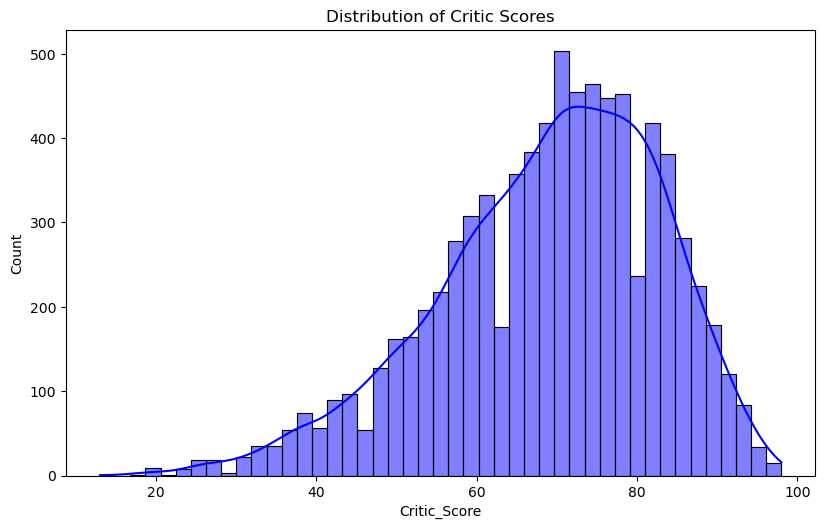

In [11]:
# Filter relevant columns and drop rows with NaN values
columns_of_interest = ['name', 'Critic_Score', 'User_Score', 'Publisher', 'Genre', 'platform', 'Developer']
df_filtered = df_game_sales[columns_of_interest]
df_filtered_cleaned = df_filtered.dropna()

# Set the plot size
plt.figure(figsize=(16, 10))

# Plot 2: Histogram of Critic Scores
plt.subplot(2, 2, 2)
sns.histplot(df_filtered_cleaned['Critic_Score'], kde=True, color='blue')
plt.title('Distribution of Critic Scores')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

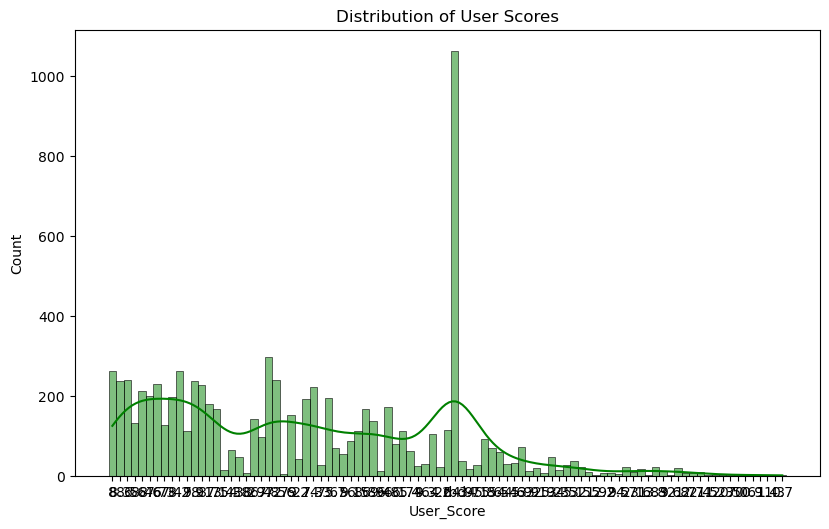

In [12]:
# Filter relevant columns and drop rows with NaN values
columns_of_interest = ['name', 'Critic_Score', 'User_Score', 'Publisher', 'Genre', 'platform', 'Developer']
df_filtered = df_game_sales[columns_of_interest]
df_filtered_cleaned = df_filtered.dropna()

# Set the plot size
plt.figure(figsize=(16, 10))

# Plot 3: Histogram of User Scores
plt.subplot(2, 2, 3)
sns.histplot(df_filtered_cleaned['User_Score'], kde=True, color='green')
plt.title('Distribution of User Scores')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

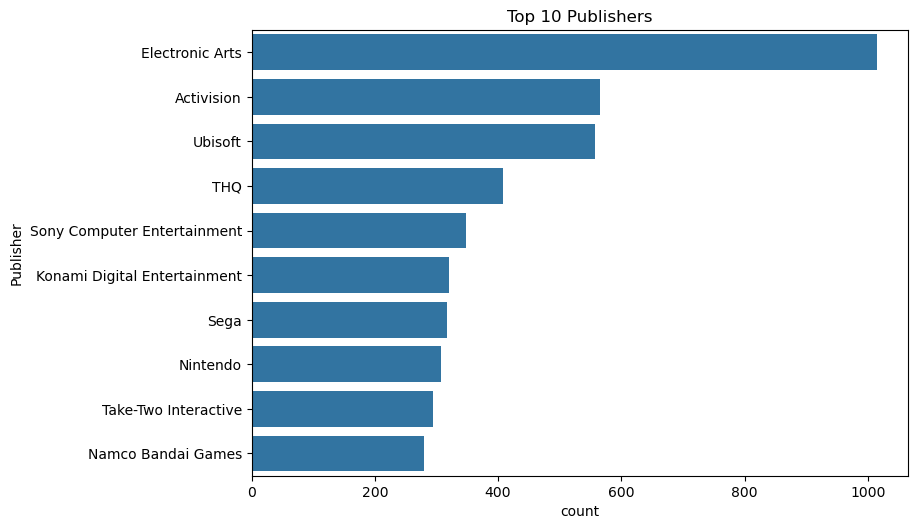

In [13]:
# Filter relevant columns and drop rows with NaN values
columns_of_interest = ['name', 'Critic_Score', 'User_Score', 'Publisher', 'Genre', 'platform', 'Developer']
df_filtered = df_game_sales[columns_of_interest]
df_filtered_cleaned = df_filtered.dropna()

# Set the plot size
plt.figure(figsize=(16, 10))

# Plot 4: Countplot for Publisher (Top 10) with game names
plt.subplot(2, 2, 4)
sns.countplot(y='Publisher', data=df_filtered_cleaned, order=df_filtered_cleaned['Publisher'].value_counts().index[:10])
plt.title('Top 10 Publishers')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [14]:
# Find the highest Critic Score
max_critic_score = df_game_sales['Critic_Score'].max()

# Filter the DataFrame to show the row(s) with the highest Critic Score
df_highest_critic_score = df_game_sales[df_game_sales['Critic_Score'] == max_critic_score]

# Print the result
print(df_highest_critic_score)

                                    name platform  Year   Genre Publisher  \
93  The Legend of Zelda: Ocarina of Time      N64  1998  Action  Nintendo   

     NA    EU    JP  Other  Global  Critic_Score  Critic_Count User_Score  \
93  4.1  1.89  1.45   0.16     7.6          99.0           NaN        9.1   

   Developer Rating  
93       NaN    NaN  


In [15]:
# Group by 'Publisher' and count the number of games (rows) for each publisher
publisher_counts = df_game_sales['Publisher'].value_counts()

# Get the most popular publisher (the one with the highest count)
most_popular_publisher = publisher_counts.idxmax()
most_popular_publisher_count = publisher_counts.max()

# Print the result
print(f"The most popular publisher is {most_popular_publisher} with {most_popular_publisher_count} games.")

The most popular publisher is Electronic Arts with 1347 games.


In [16]:
# Group by 'Genre' and count the number of games (rows) for each genre
genre_counts = df_game_sales['Genre'].value_counts()

# Get the most popular genre (the one with the highest count)
most_popular_genre = genre_counts.idxmax()
most_popular_genre_count = genre_counts.max()

# Print the result
print(f"The most popular genre is {most_popular_genre} with {most_popular_genre_count} games.")

The most popular genre is Action with 3321 games.


In [17]:
# Filter and select specific columns (e.g., 'name' and 'Publisher')
action_games = df_game_sales[df_game_sales['Genre'] == 'Action'][['name', 'Publisher']]

# Print the result
print(action_games)

                                                                                                                               name  \
16                                                                                                               Grand Theft Auto V   
17                                                                                                    Grand Theft Auto: San Andreas   
23                                                                                                               Grand Theft Auto V   
24                                                                                                      Grand Theft Auto: Vice City   
38                                                                                                             Grand Theft Auto III   
42                                                                                                               Grand Theft Auto V   
46                                                     

In [18]:
# Filter and select specific columns (e.g., 'name', 'Publisher', 'platform')
action_games_df = df_game_sales[df_game_sales['Genre'] == 'Action'][['name', 'Publisher', 'platform', 'Critic_Score']]

# Display the filtered DataFrame
print(action_games_df)

                                                                                                                               name  \
16                                                                                                               Grand Theft Auto V   
17                                                                                                    Grand Theft Auto: San Andreas   
23                                                                                                               Grand Theft Auto V   
24                                                                                                      Grand Theft Auto: Vice City   
38                                                                                                             Grand Theft Auto III   
42                                                                                                               Grand Theft Auto V   
46                                                     

In [19]:
action_games_df.head()

,name,Publisher,platform,Critic_Score
16,Grand Theft Auto V,Take-Two Interactive,PS3,97.0
17,Grand Theft Auto: San Andreas,Take-Two Interactive,PS2,95.0
23,Grand Theft Auto V,Take-Two Interactive,X360,97.0
24,Grand Theft Auto: Vice City,Take-Two Interactive,PS2,95.0
38,Grand Theft Auto III,Take-Two Interactive,PS2,97.0


In [20]:
# Adjust Pandas display options to show all rows and columns
pd.set_option('display.max_rows', None)       
pd.set_option('display.max_columns', None)    
pd.set_option('display.max_colwidth', None)   

# Print the entire DataFrame (e.g., for the action games DataFrame)
print(action_games_df)

                                                                                                                               name  \
16                                                                                                               Grand Theft Auto V   
17                                                                                                    Grand Theft Auto: San Andreas   
23                                                                                                               Grand Theft Auto V   
24                                                                                                      Grand Theft Auto: Vice City   
38                                                                                                             Grand Theft Auto III   
42                                                                                                               Grand Theft Auto V   
46                                                     

In [21]:
action_games_df.describe()

,Critic_Score
count,1913.000000
mean,66.640878
std,14.218636
min,19.000000
25%,57.000000
50%,68.000000
75%,77.000000
max,99.000000


In [22]:
df_game_sales.describe()

,Year,NA,EU,JP,Other,Global,Critic_Score,Critic_Count
count,16441.000000,16441.000000,16441.000000,16441.000000,16441.000000,16441.000000,8299.000000,8007.000000
mean,2006.491698,0.264069,0.145922,0.078504,0.047656,0.536404,69.077961,26.431373
std,5.877848,0.818450,0.506766,0.311126,0.188020,1.558755,13.888994,18.996667
min,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,3.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,60.500000,12.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,71.000000,22.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,0.470000,79.000000,36.000000
max,2020.000000,41.360000,28.960000,10.220000,10.570000,82.530000,99.000000,113.000000


In [47]:
# Top Action games
top_action_games = df_game_sales[df_game_sales['Genre'] == 'Action'] \
                    .sort_values(by='Critic_Score', ascending=False) \
                    [['name', 'platform', 'Publisher', 'Critic_Score']].head(10)

# Print the results
print("Top Action Games:\n", top_action_games, "\n")

Top Action Games:
                                       name platform             Publisher  \
93    The Legend of Zelda: Ocarina of Time      N64              Nintendo   
51                     Grand Theft Auto IV     X360  Take-Two Interactive   
57                     Grand Theft Auto IV      PS3  Take-Two Interactive   
16                      Grand Theft Auto V      PS3  Take-Two Interactive   
23                      Grand Theft Auto V     X360  Take-Two Interactive   
38                    Grand Theft Auto III      PS2  Take-Two Interactive   
42                      Grand Theft Auto V      PS4  Take-Two Interactive   
608                           Perfect Dark      N64              Nintendo   
165                     Grand Theft Auto V     XOne  Take-Two Interactive   
1710                    Grand Theft Auto V       PC  Take-Two Interactive   

      Critic_Score  
93            99.0  
51            98.0  
57            98.0  
16            97.0  
23            97.0  
38     

In [48]:
top_action_games.head()

,name,platform,Publisher,Critic_Score
93,The Legend of Zelda: Ocarina of Time,N64,Nintendo,99.0
51,Grand Theft Auto IV,X360,Take-Two Interactive,98.0
57,Grand Theft Auto IV,PS3,Take-Two Interactive,98.0
16,Grand Theft Auto V,PS3,Take-Two Interactive,97.0
23,Grand Theft Auto V,X360,Take-Two Interactive,97.0


In [49]:
# Top Sports games
top_sports_games = df_game_sales[df_game_sales['Genre'] == 'Sports'] \
                    .sort_values(by='Critic_Score', ascending=False) \
                    [['name', 'Publisher', 'platform', 'Critic_Score']].head(10)

# Print the results
print("Top Sports Games:\n", top_sports_games, "\n")

Top Sports Games:
                           name                     Publisher platform  \
226   Tony Hawk's Pro Skater 2                    Activision       PS   
248   Tony Hawk's Pro Skater 3                    Activision      PS2   
1856                   NFL 2K1                          Sega       DC   
1695  Tony Hawk's Pro Skater 2                    Activision      GBA   
282            Madden NFL 2003               Electronic Arts      PS2   
2647         ISS Pro Evolution  Konami Digital Entertainment       PS   
450            Madden NFL 2002               Electronic Arts      PS2   
1082        NCAA Football 2004               Electronic Arts      PS2   
3835           Madden NFL 2004               Electronic Arts       GC   
340   Tony Hawk's Pro Skater 4                    Activision      PS2   

      Critic_Score  
226           98.0  
248           97.0  
1856          97.0  
1695          95.0  
282           95.0  
2647          94.0  
450           94.0  
1082     

In [50]:
top_sports_games.head()

,name,Publisher,platform,Critic_Score
226,Tony Hawk's Pro Skater 2,Activision,PS,98.0
248,Tony Hawk's Pro Skater 3,Activision,PS2,97.0
1856,NFL 2K1,Sega,DC,97.0
1695,Tony Hawk's Pro Skater 2,Activision,GBA,95.0
282,Madden NFL 2003,Electronic Arts,PS2,95.0


In [51]:
# Top Shooter games
top_shooter_games = df_game_sales[df_game_sales['Genre'] == 'Shooter'] \
                     .sort_values(by='Critic_Score', ascending=False) \
                     [['name', 'Publisher', 'platform', 'Critic_Score']].head(10)

# Print the results
print("Top Shooter Games:\n", top_shooter_games)

Top Shooter Games:
                       name               Publisher platform  Critic_Score
129   Halo: Combat Evolved  Microsoft Game Studios       XB          97.0
513          Metroid Prime                Nintendo       GC          97.0
512               BioShock    Take-Two Interactive     X360          96.0
82           GoldenEye 007                Nintendo      N64          96.0
8996        The Orange Box         Electronic Arts       PC          96.0
283              Half-Life           Vivendi Games       PC          96.0
953         The Orange Box         Electronic Arts     X360          96.0
4643              BioShock    Take-Two Interactive       PC          96.0
657            Half-Life 2           Vivendi Games       PC          96.0
2666              Portal 2          Valve Software       PC          95.0


In [52]:
top_shooter_games.head()

,name,Publisher,platform,Critic_Score
129,Halo: Combat Evolved,Microsoft Game Studios,XB,97.0
513,Metroid Prime,Nintendo,GC,97.0
512,BioShock,Take-Two Interactive,X360,96.0
82,GoldenEye 007,Nintendo,N64,96.0
8996,The Orange Box,Electronic Arts,PC,96.0


In [40]:
# Filter games published by Electronic Arts
electronic_arts_games = df_game_sales[df_game_sales['Publisher'] == 'Electronic Arts'][['name', 'platform', 'Genre', 'Critic_Score']]

# Display the Electronic Arts game titles
print(electronic_arts_games)

                                                                 name  \
77                                                            FIFA 16   
81                                                     FIFA Soccer 13   
85                                                         The Sims 3   
87                                       Star Wars Battlefront (2015)   
94                                                            FIFA 17   
101                                                     Battlefield 3   
102                                        Need for Speed Underground   
104                                                     Battlefield 3   
113                                      Need for Speed Underground 2   
114                                         Medal of Honor: Frontline   
122                                                           FIFA 12   
126                                                           FIFA 14   
143                                                

In [41]:
electronic_arts_games.head()

,name,platform,Genre,Critic_Score
77,FIFA 16,PS4,Sports,82.0
81,FIFA Soccer 13,PS3,Action,88.0
85,The Sims 3,PC,Simulation,86.0
87,Star Wars Battlefront (2015),PS4,Shooter,NaN
94,FIFA 17,PS4,Sports,85.0


In [42]:
# Filter games published by Ubisoft
ubisoft_games = df_game_sales[df_game_sales['Publisher'] == 'Ubisoft'][['name', 'platform', 'Genre', 'Critic_Score']]

# Display the Ubisoft game titles
print(ubisoft_games)

                                                                  name  \
61                                                        Just Dance 3   
68                                                        Just Dance 2   
103                                                         Just Dance   
116                                                       Just Dance 4   
127                                               Assassin's Creed III   
159                                                Assassin's Creed II   
160                                                   Assassin's Creed   
176                                               Assassin's Creed III   
181                                                Assassin's Creed II   
218                                                   Assassin's Creed   
253                                    Michael Jackson: The Experience   
268                                      Assassin's Creed: Revelations   
276                                   

In [43]:
ubisoft_games.head()

,name,platform,Genre,Critic_Score
61,Just Dance 3,Wii,Misc,74.0
68,Just Dance 2,Wii,Misc,74.0
103,Just Dance,Wii,Misc,49.0
116,Just Dance 4,Wii,Misc,74.0
127,Assassin's Creed III,PS3,Action,85.0


In [44]:
# Filter games published by Activision
activision_games = df_game_sales[df_game_sales['Publisher'] == 'Activision'][['name', 'platform', 'Genre', 'Critic_Score']]

# Display the Activision game titles
print(activision_games)

                                                                     name  \
29                                         Call of Duty: Modern Warfare 3   
31                                              Call of Duty: Black Ops 3   
32                                                Call of Duty: Black Ops   
34                                             Call of Duty: Black Ops II   
35                                             Call of Duty: Black Ops II   
36                                         Call of Duty: Modern Warfare 2   
37                                         Call of Duty: Modern Warfare 3   
41                                                Call of Duty: Black Ops   
55                                         Call of Duty: Modern Warfare 2   
60                                                   Call of Duty: Ghosts   
69                                                   Call of Duty: Ghosts   
70                                         Call of Duty 4: Modern Warfare   

In [45]:
activision_games.head()

,name,platform,Genre,Critic_Score
29,Call of Duty: Modern Warfare 3,X360,Shooter,88.0
31,Call of Duty: Black Ops 3,PS4,Shooter,NaN
32,Call of Duty: Black Ops,X360,Shooter,87.0
34,Call of Duty: Black Ops II,PS3,Shooter,83.0
35,Call of Duty: Black Ops II,X360,Shooter,83.0


In [54]:
# Group by Platform and get the earliest release year
oldest_platforms = df_game_sales.groupby('platform')['Year'].min().sort_values()

# Display the result
print(oldest_platforms)

platform
2600    1980
NES     1983
DS      1985
PC      1985
GB      1988
SNES    1990
GEN     1990
GG      1992
SCD     1993
NG      1993
SAT     1994
PS      1994
3DO     1994
TG16    1995
PCFX    1996
N64     1996
DC      1998
WS      1999
GBA     2000
XB      2000
PS2     2000
GC      2001
PSP     2004
X360    2005
PS3     2006
Wii     2006
3DS     2011
PSV     2011
WiiU    2012
PS4     2013
XOne    2013
Name: Year, dtype: int64
